# Dogs vs Cats For Udacity




## 一、定义 Definition
### 1、项目概述 Project Overview
### 2、问题陈述 Problem Statement
### 3、评价指标 Metrics

## 二、分析 Analysis
### 1、数据 Data 
### 2、算法和设计 Algorithms and Techniques

## 三、创建一个数据集 Create A Dateset
### 1、数据集收集 Data Collection
### 2、数据集分析 Data Analysis
### 3、数据处理 Data Scientists


## 四、 建模 
### 1、框架选择 Deep Learning Framework
### 2、模型设计 
### 3、实现及调试
### 4、实验和调参
### 5、模型提升

## 五、结论

## 一、定义 Definition

### 1、项目概述 Project Overview
这是一个kaggle上的竞赛项目，项目主要通过编写一个算法来分类图像是包含猫还是狗，这对人类，猫狗来说很容易，但对电脑来说有点困难。
项目见链接https://www.kaggle.com/c/dogs-vs-cats
    
    Asirra数据集介绍
Web服务通常受到人们解决的挑战的保护，但对于计算机来说却很难。这种挑战通常被称为  CAPTCHA  （完全自动公共图灵测试，以告诉计算机和人类）或HIP（人类交互证明）。HIP用于多种用途，例如减少电子邮件和博客垃圾邮件以及防止对网站密码的暴力攻击。

Asirra（限制访问的动物物种图像识别）是一种HIP，通过要求用户识别猫和狗的照片来工作。这项任务对于计算机来说很难，但研究表明，人们可以快速准确地完成任务。许多人甚至认为这很有趣！以下是Asirra界面的示例：

Asirra因其与Petfinder.com的合作而独树一帜，  Petfinder.com是世界上最大的致力于为无家可归宠物寻找家园的网站。他们为微软研究院提供了超过三百万只猫和狗的图像，这些图像由美国各地数千个动物收容所的人工分类。Kaggle很幸运能够提供这些数据的一部分用于娱乐和研究。 

### 2、问题陈述 Problem Statement
    
使用深度学习方法识别一张图片是猫还是狗。

输入：一张彩色图片
输出：狗的概率
    
### 3、评价指标 Metrics

根据正确标记的图像的百分比评估性能。要确定您打破Asirra CAPTCHA的几率，请将您的百分比提高到12次方。

“但分类准确性是一个有缺陷的指标！” 你愤怒地向你的监视器尖叫，“我的天才要求你接受我预测的后验概率！” 这可能是真的，但有时简单就是好的。这里只有狗和猫...不允许0.5只狗猫杂交猜测！

提交格式
您的提交应该有一个标题。对于测试集中的每个图像，预测其id的标签（1 = dog，0 = cat）：

ID，标签
1,0
2,0
3,0
等等...

## 二、分析 Analysis

### 1、数据 Data 
     这是一个kagglle上的竞赛项目，我们使用kaggle上的数据集即可，无需再收集数据。

### 2、算法和设计 Algorithms and Techniques
    本节参考了intel的课程https://software.intel.com/zh-cn/articles/hands-on-ai-part-15-overview-of-convolutional-neural-networks-for-image-classification
    猫狗识别本质上是一个分类的问题，传统的机器学习的分类算法有多层感知器MLP，支持向量机SVM，K-近邻、逻辑回归、神经网络等算法，传统方法的主要限制是人类专家的参与，他们选择集合和步骤序列来生成特征。
    随着时间的推移，人们注意到许多特征生成技术可以通过内核（过滤器） -小矩阵（特征大小为5 x 5）来推广，这些矩阵与初始图像卷积。卷积可以被认为是一个两步迭代过程（见图1）：

    1.在初始图像上滑动相同的固定内核。
    2.在每个步骤中，计算内核与内核当前位置的初始图像之间的点积。
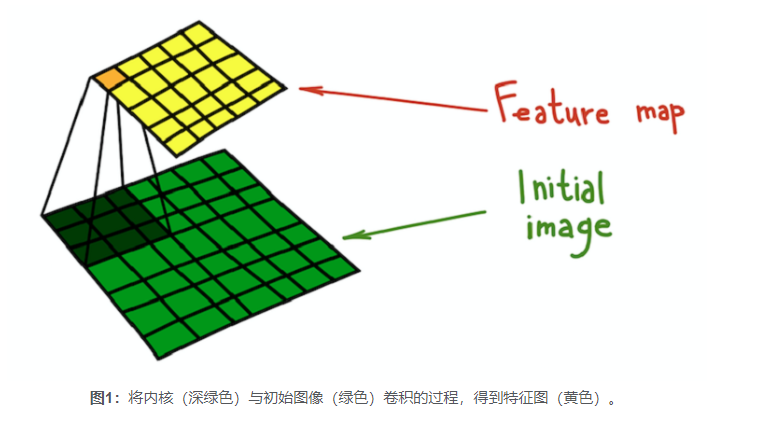
与内核进行图像卷积的结果称为特征映射，即特征提取，卷积有两个优点，参数共享、稀疏矩阵（局部感知野）
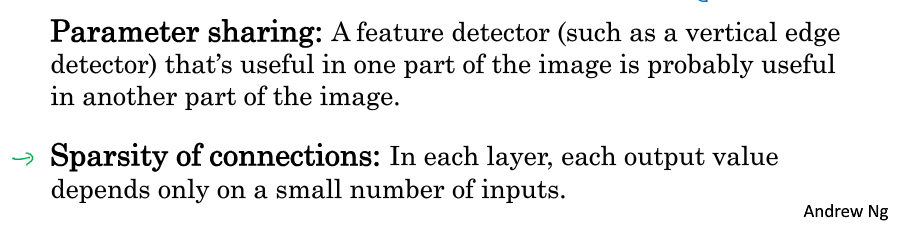

**卷积神经网络**
传统的图像分类方法有一些相当大的缺点：

多端框架，而不是端到端管道。
过滤器是很好的泛化工具，但它们是固定的矩阵。如何选择要放入过滤器的重量？
幸运的是，人们提出了可学习的过滤器，这是CNN背后的核心概念。这个想法很简单：让我们学习哪些过滤器应该用于以最佳方式描述图像以完成此任务。

没有独特的CNN发明者，但是Y. LeCun等人的论文中首次出现的可追溯到LeNet-5 *的文章之一，基于梯度的学习应用于文档识别。

CNNs一举两得：没有必要预先确定过滤器，学习过程变得端到端。常见的CNN架构包括以下部分：

    卷积层
    池化层
    密集（完全连接）层

卷积层
所述卷积层是细胞神经网络的主构建块。卷积层具有一组特征属性：

本地（稀疏）连接。在密集层中，每个神经元都连接到前一层的所有神经元（这就是为什么它被称为密集）。在卷积层中，每个神经元仅连接到前一层神经元的一小部分。
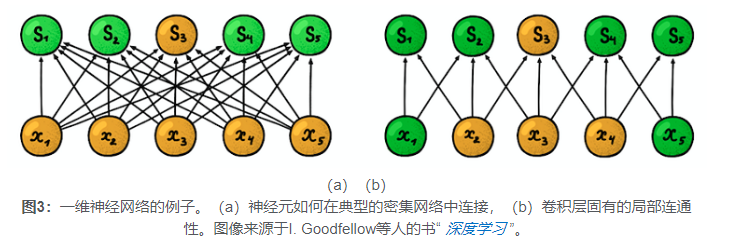

神经元所连接的区域的空间大小称为滤波器大小（在时间序列等1D数据的情况下为滤波器长度，在像图像的2D数据的情况下为宽度/高度 t）。在图3b中，滤波器大小等于3. 用于建立此连接的权重称为滤波器（在1D数据的情况下为向量，对于2D为矩阵）。Stride是我们将过滤器滑过数据的步骤的大小（步幅等于图3b中的1）。本地连接的想法不过是滑动内核。卷积层中的每个神经元表示并实现内核在初始图像上滑动的一个特定位置。

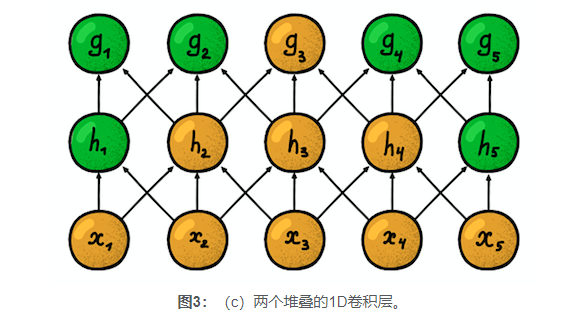

还有一个更重要的概念叫做感受野。它反映了从当前神经元可以看到初始信号中的多少个位置。例如，图3（c）中所示的网络的第一层中的感受野等于过滤器大小3，因为每个神经元仅与初始信号的三个神经元连接。但是在第二层中，感受野已经等于5，因为第二层的神经元聚集了第一层的三个神经元，每个神经元的感受野等于3.此外，它随着深度线性增长。

参数共享。回想一下，在经典图像处理中，我们在整个图像中滑动相同的内核。这同样的想法也适用。让我们只修复一个图层的过滤器大小的权重数，并在图层中的所有神经元上共享这些权重。它对应于在整个图像上滑动一个内核。但是，有人会争辩说，我们怎样才能学到具有如此少量参数的东西？

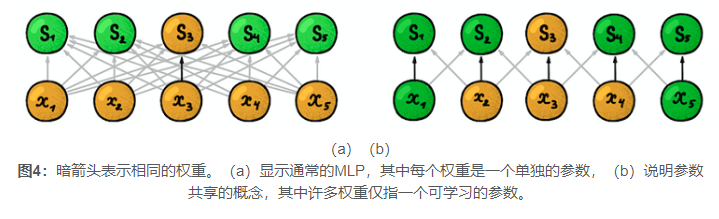
空间排列。这个问题的答案很简单 - 让我们在一个层中学习多个过滤器！它们将彼此平行放置，因此形成一个新的维度。

让我们慢一点，考虑一个227 x 227 RGB图像的2D示例来解释所有引入的概念。请注意，我们现在有一个三通道输入图像，这实际上意味着我们有三个输入图像或3D输入。
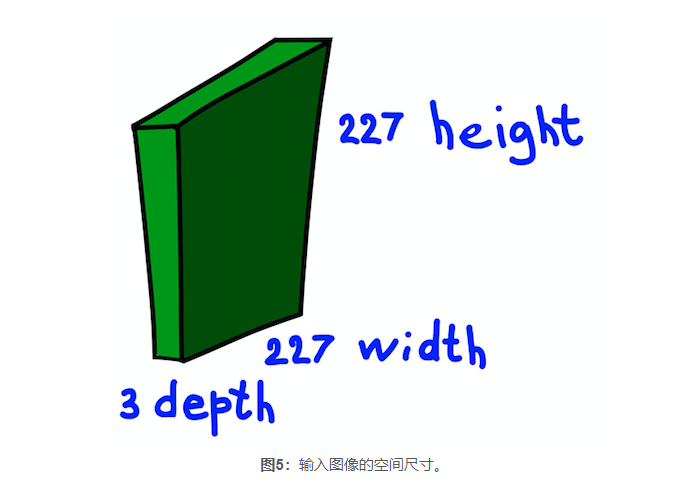

让我们将通道尺寸作为图像的深度来解决（请注意，这与神经网络的深度不同，后者等于其中的层数）。问题是如何为该案例定义内核。

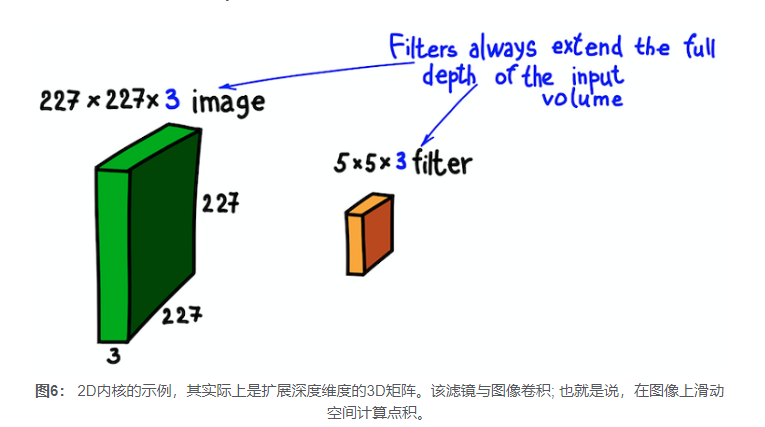

答案很简单但不明显 - 让我们的内核成为三维的。前两个维度与之前完全相同（内核的宽度和高度），而第三个维度应始终等于输入的深度。
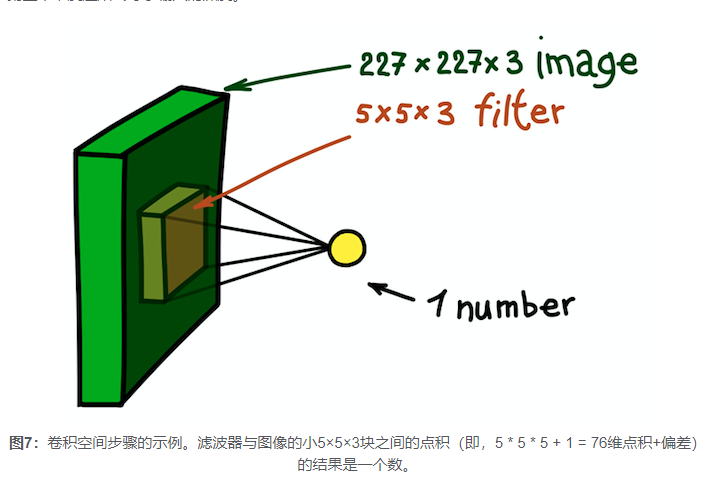

在这种情况下，初始图像的整个5×5×3区域被映射成一个数字，而3D图像本身将被映射到特征（激活）图。特征图是一组神经元，每个神经元计算其自身的功能，考虑到上面讨论的两个主要原则：局部连通性（每个神经元仅连接到输入数据的一小部分）和参数共享（所有神经元使用相同的过滤器） ）。理想情况下，此特征图与我们在传统示例中看到的相同 - 它将卷积输入图像的结果与过滤器一起存储。

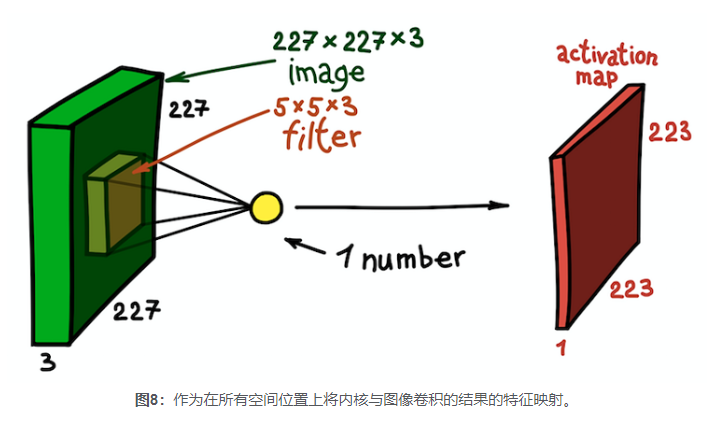
请注意，要素图的深度等于1，因为我们只使用了一个过滤器。没有什么能阻止我们使用更多过滤器; 例如，6。所有这些都将查看相同的输入数据并且将彼此独立地行动。让我们更进一步，堆叠这些功能图。所有这些都具有相同的空间尺寸，因为滤波器具有相同的尺寸。因此，这些堆叠的特征图可以被认为是新的3D数据阵列，其中深度维度由来自不同内核的特征图表示。在该视图中，输入图像的RGB通道不超过三个初始特征图。

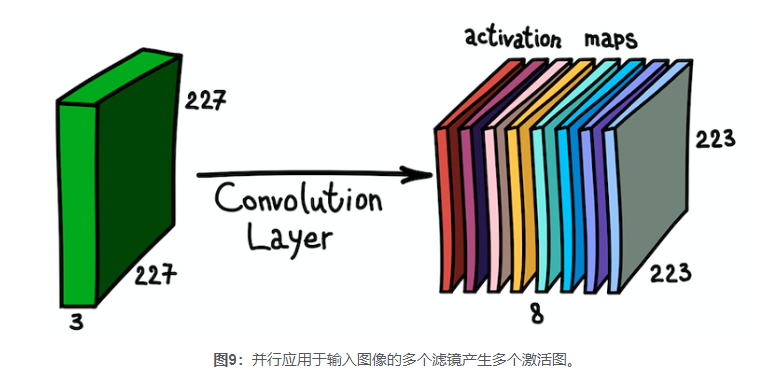

理解这个特征映射及其堆叠的概念是至关重要的，因为一旦我们得到它，我们就可以扩展我们网络的架构并将卷积层堆叠在一起，以增加感知域并使分类器更丰富。

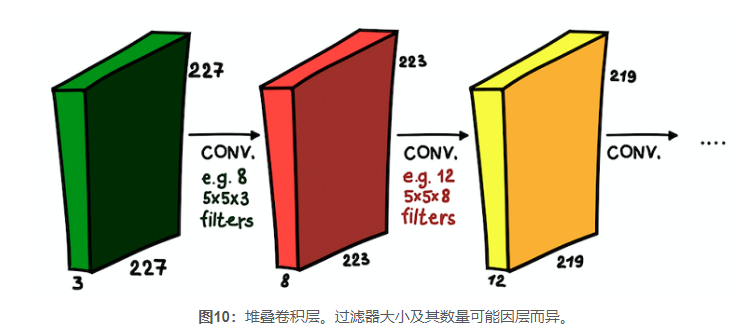

现在我们了解卷积层是什么。这些层的主要目标与传统方法中的主要目标相同 - 从图像中检测有意义的特征。虽然这些特征在第一层（垂直/水平线的存在）中可以非常简单，但它们的抽象性随着网络的深度而增长（狗/猫/人的存在）。

汇集图层
虽然卷积层是CNN的主要构建块，但还有一个经常使用的重要部分 - 池化层。与传统的图像处理没有直接的类比，但是池化可以看作是一种不同类型的内核。那是什么？

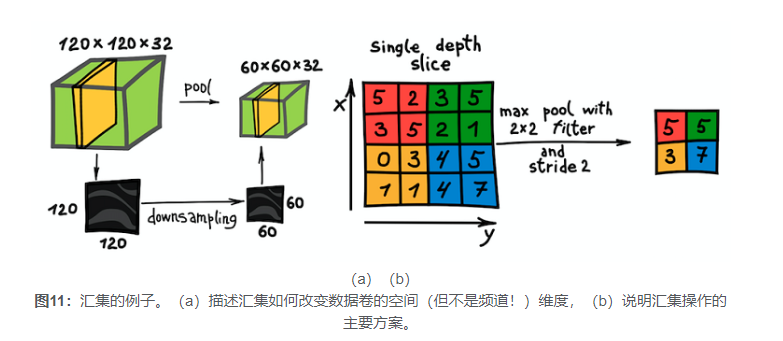

池化过滤每个输入像素的邻域区域，具有一些预定义的聚合函数，例如最大值，平均值等。池化实际上与卷积相同，但像素组合功能不限于点积。另一个更重要的区别是汇集仅在空间维度中起作用。池化层的特征是步幅通常等于过滤器大小（公共值为2）。

汇集有三个主要目标：

    空间维数减少或下采样。这样做是为了减少参数的数量。
    接收场增长。通过汇集神经元，输入信号的更多步骤可以在以下层中累积。
    对输入信号中的模式位置中的小扰动的平移不变性。通过对输入信号的小邻域进行聚合统计，池化可能能够忽略其中的小空间移动。
    
密集的层
卷积和池化层为图像中的一个目标生成特征提供服务。最后一步是根据检测到的特征对输入图像进行分类。在CNN中，它通过网络顶部的密集层来完成。这称为分类部分。它可能包含多个堆叠的，完全连接的层，但它通常以softmax 激活层结束，其中单元的数量等于类的数量。softmax层输出输入对象的类的概率分布。然后，可以通过选择最可能的类来对图像进行分类。

**卷积神经网络架构**

如今，计算机视觉和图像分类中的进度背后的主要驱动程序是ImageNet *挑战。它是一种数据挑战，其中参与者提供的大图像数据集（一个万+图像），并且我们的目标是开发可以分类为1000年对象类，如狗，猫，汽车的冻结付款输出图像的算法，和等等，具有最少的错误。

根据官方规则，算法需要制作的最大五个对象中的类别按降序顺序为每个图像的信心的列表。标签的质量将基于最适合的图像的接地事实标签的标签上进行评估。这一理念是允许一种算法，以识别图像中的多个对象并不会处罚如果发现对象的一个实际存在，但不是包括在地面事实。

在这一挑战的第一年，参与方提供预先提取的图像功能的模型培训; 例如，向量量化SIFT *功能适用于包含字词或spatialbag金字塔表示形式。然而，真正中断发生在2012年，当一个团队在多伦多大学展示了深度神经网络，可实现更出色的结果相比传统的机器学习模型培训媒介所做的预提取功能。我们将介绍从2012年的第一个突破性体系结构和高达2015年后续以下几节中。

    VGG
 在2014年，K.Simonyan和建议的体系结构的牛津大学从A.Zisserman称为VGG。主要和非同寻常是结构的对保持尽可能简单的过滤器。这样，所有卷积对3号尺寸的过滤器和跨距1，并且所有poolings大小2，跨距2. 但这并非全部。卷积机组中的简易性与网络已显着发展深入 - - 它有19层！Crucial“中的第一次这项工作中，有效栈不共用的情况下的卷积层。其背后的直觉是，此类堆叠仍提供了一个大型足够乐于接受字段（例如，三个堆栈式多层的与步幅拥有同一乐于接受字段作为一个7 x 7卷积层1的3倍3卷积），但参数的数目明显小于在网络中对大过滤器（作为一种正规化器），以及可能推出更多的状态。

本质上，作者证明，即使使用非常简单的构建模块，其中一个可实现ImageNet上最先进的质量。顶部的5错误率提升高达7.3％。
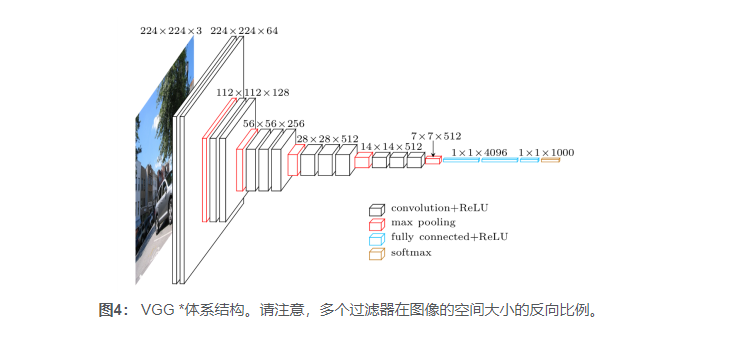

    GoogleNet
 以前，所有取得了通过简化过滤器，并使网络更深入。在2014年，C.Szegedy等人选择了一种完全不同的方式，并称为GoogLeNet那时，由创建的最复杂的体系结构。
 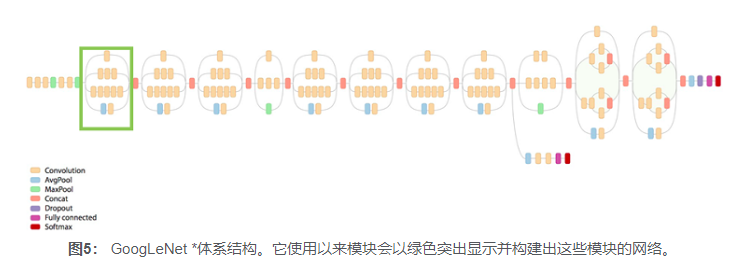
 此项工作的主要贡献之一就是所谓的以来模块，图6所示。其他网络执行顺序处理的输入 - 逐层，而在以来模块中，正在并行处理的输入。这可以使其为推理提高速度，最大限度以及减少参数的总数。
 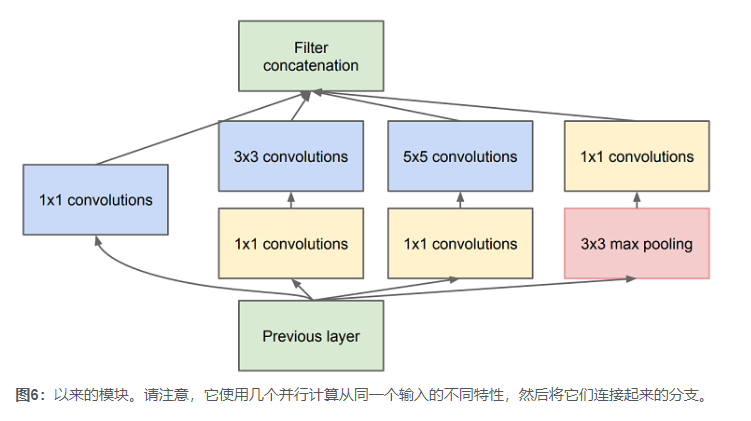
 图6：以来的模块。请注意，它使用几个并行计算从同一个输入的不同特性，然后将它们连接起来的分支。

一个更有趣的以来模块中使用的作用在于1x1的卷积。直到其中一个后随联系的过滤器涵盖整个深度维度的事实这似乎毫无意义。因此，1x1的卷积也将只需三维度降低的方法是跨功能地图维度。在网络中的网络中，一篇文章由M.Lin等中，推出首次这种卷积状语从句：通过一个[1×1]卷积-counter直觉有用，可以找到全面而直观的相关说明A.Prakash的博客文章。

毕竟，它将前五个错误率再降低了一半，降至6.7％。

    RESNET
  
2015年，来自微软亚洲研究院的一组研究人员（Kaiming He等人）提出了这个想法，现在被认为是社区大部分人深度学习发展过程中最重要的步骤之一，

深度网络的主要问题之一是消失的梯度问题。简而言之，这是在梯度计算的反向传播算法期间出现的技术问题。在反向传播中，我们使用链式规则，如果网络头部的梯度很小，那么当它到达网络的开头时，它可能变得无限小，这将导致各种各样的问题，包括无法学习任何东西（详情请参阅消失的梯度问题，R.Kapur的博客文章）。

为了克服这个问题，Kaiming He等人。提出了以下想法 - 让它学习残差映射（应该添加到输入的部分）而不是映射本身。从技术上讲，这是通过跳过连接实现的，如图7所示。
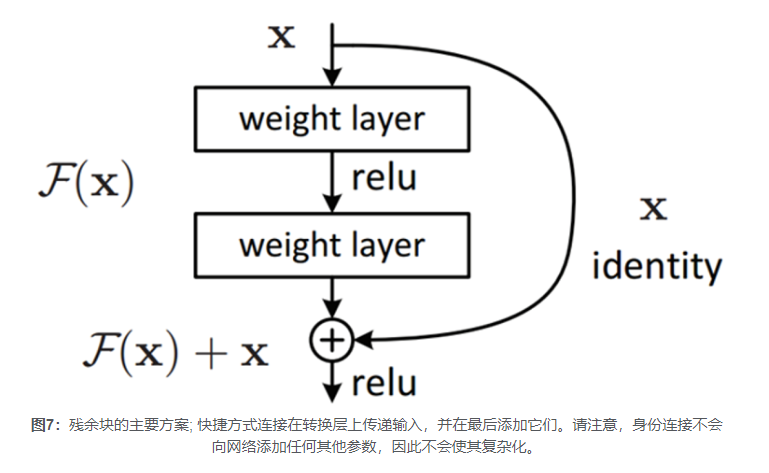
这个想法非常简单但非常有效。它通过允许渐变流动而不通过身份连接从顶层到底部的任何变化来解决消失的梯度问题。这导致可以训练非常非常深的网络。

2015年ImageNet挑战赛的成功网络有152层（作者能够训练1001层网络，但它给出了大致相同的结果，因此他们放弃了它）。此外，它将前五个错误率降低了两倍至3.6％。根据我在ImageNet上与ConvNet竞争的一项研究，A。Karpathy的一项研究表明，人类在这项任务上的表现约为5％。这意味着ResNet能够超越人类，至少在此图像分类任务中。

## 三、创建一个数据集


### 1、数据集收集

    数据集可以从 kaggle 上下载。:
    
https://www.kaggle.com/c/dogs-vs-cats-redux-kernels-edition/data


下载的数据集：
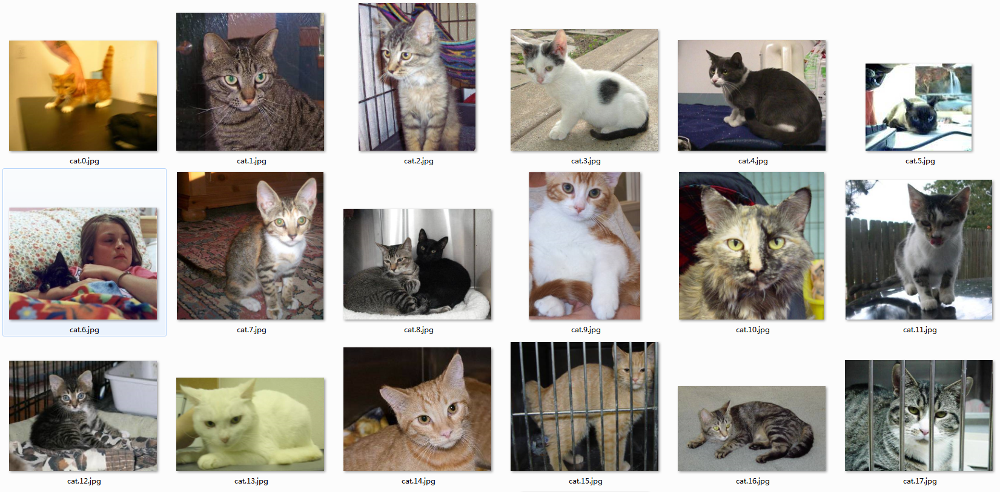

### 2、数据集分析
    
下载的训练数据集中和测试集中除了有猫和狗之外还包含了一些异常的数据，吴恩达深度学习课程机构化机器学习项目的2.2节清楚标记错误数据这一节中有将如何处理错误标记数据。
深度学习算法对训练集中随机的误差有很强的鲁棒性，所以当错误数据不多时，可以不去处理。（这点我没有验证，我们选择处理了训练集中的错误数据）

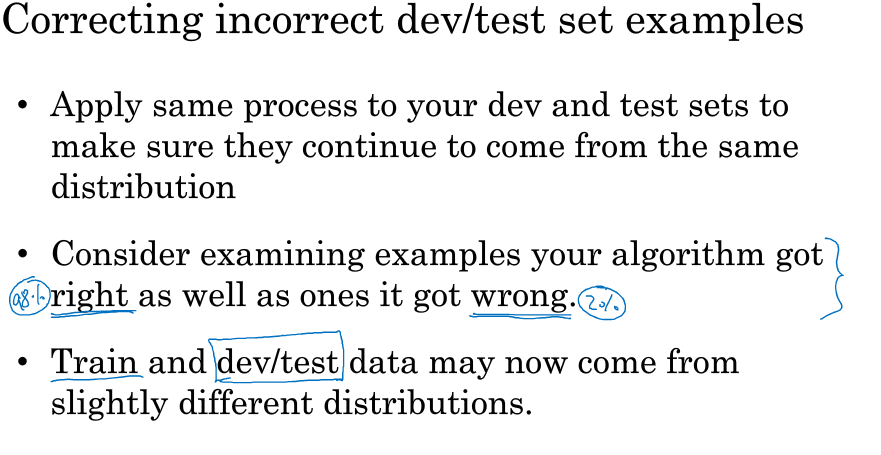
### 3、数据预处理

预处理是在讲数据输入模型之前对数据进行的所以转换的总称，，包括居中，归一化，平移，旋转，剪切等。一般来说，有两种情况可能需要进行预处理：

 - 数据清理。假设你在图像中有一些文物。为了使模型的学习过程更容易，我们可以使用预处理来删除工件。

 - 数据增强。有时候，小数据集不足以让深层模型学得足够好。该数据增强方法是解决这一问题非常有用。它是以各种可能的方式转换每个数据样本并将所有增广样本添加到数据集的过程。通过这样做可以增加数据集的有效大小。应用转换通常从预定义的集合中随机选择。

由于我们使用的数据足够多，所以只需要进行数据清理。


Keras 的应用模块（keras.applications）提供了带有预训练权值的深度学习模型，这些模型可以用来进行预测、特征提取和微调（fine-tuning）。我们打算使用Keras已经训练好的模型来清理数据。Kears支持的模型见下图：
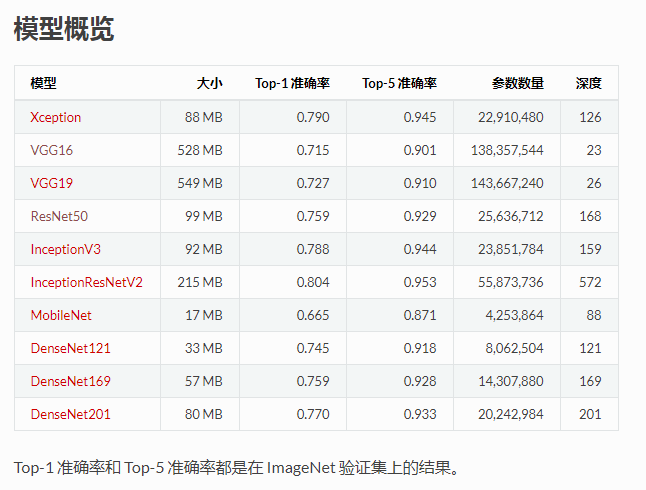


为了最大概率的去掉异常的图片，我们计划选取ResNet50、InceptionV3、Xception、VGG16、DenseNett169这5个模型来预测所有的样本，然后取5个模型预测的异常样本的并集，再人工筛选出异常的图片，将他们清理掉。

 - 数据集

由于下载的数据集总共有25000个图片，猫狗各12500个，数据集太大，我们先选取猫狗各前1000个图片，再加入47个异常的图片，共计2047个图片来验证我们的代码和选择合适的top值。

json_file 包含了ImageNet 1000个分类的信息 格式为` "0": ["n01440764", "tench"]` 这个主要是用来打印信息

train_data_dir 包含了样本的目录

anomaly_data_dir 存放异常样本的图片

In [1]:
from keras import applications
from keras.preprocessing.image import ImageDataGenerator
import numpy as np
import json
import shutil  
import pandas as pd
import os

json_file = 'imagenet_class_index.json'
train_data_dir = 'data/train_all/'
anomaly_data_dir = 'data/anomaly_all/'

Using TensorFlow backend.


 - ImageNet分类分析
 
 ImageNet图片总共有1000个分类，我们需要选取出猫、狗和一些比较接近猫狗的类别来作为我们的判断的依据。这里我们选取了猫、狗、狐狸、狼、豹这5个类别：


In [2]:
dog = [
'n02085620','n02085782','n02085936','n02086079','n02086240',
'n02086646','n02086910','n02087046','n02087394','n02088094',
'n02088238','n02088364','n02088466','n02088632','n02089078',
'n02089867','n02089973','n02090379','n02090622','n02090721',
'n02091032','n02091134','n02091244','n02091467','n02091635',
'n02091831','n02092002','n02092339','n02093256','n02093428',
'n02093647','n02093754','n02093859','n02093991','n02094114',
'n02094258','n02094433','n02095314','n02095570','n02095889',
'n02096051','n02096177','n02096294','n02096437','n02096585',
'n02097047','n02097130','n02097209','n02097298','n02097474',
'n02097658','n02098105','n02098286','n02098413','n02099267',
'n02099429','n02099601','n02099712','n02099849','n02100236',
'n02100583','n02100735','n02100877','n02101006','n02101388',
'n02101556','n02102040','n02102177','n02102318','n02102480',
'n02102973','n02104029','n02104365','n02105056','n02105162',
'n02105251','n02105412','n02105505','n02105641','n02105855',
'n02106030','n02106166','n02106382','n02106550','n02106662',
'n02107142','n02107312','n02107574','n02107683','n02107908',
'n02108000','n02108089','n02108422','n02108551','n02108915',
'n02109047','n02109525','n02109961','n02110063','n02110185',
'n02110341','n02110627','n02110806','n02110958','n02111129',
'n02111277','n02111500','n02111889','n02112018','n02112137',
'n02112350','n02112706','n02113023','n02113186','n02113624',
'n02113712','n02113799','n02113978']


wolf = [
'n02114367','n02114548','n02114712','n02114855',
'n02115641','n02115913','n02116738','n02117135']

cat = [
'n02123045','n02123159','n02123394','n02123597',
'n02124075','n02125311','n02127052']

fox = [
'n02119022','n02119789',
'n02120079','n02120505']

panther = [
'n02128385','n02128757',
'n02128925']

cat_dog = panther + fox + cat + wolf + dog

 - 模型初始化
 
 model_list 5个模型的列表
 
 top_list  5个模型对应使用的top值
 
 error_list 存放异常样本名的列表
 
 这里我定义了一个model_init的函数来初始化使用哪一模型，返回值是模型、对应模型的preprocess_input 、decode_predictions 函数、input_shape的大小。
 
这里要特别说明下，我遇到的几个问题。最开始使用模型预测的准确率非常低，Xception top25的准确率只有50%左右，实验了其他模型，准确率也不是很高，后来查看Keras的文档和示例，发现了两个问题：

第一个问题是ImageDataGenerator未设置preprocess_input函数，The preprocess_input function is meant to adequate your image to the format the model requires。开始我没有设置这个函数，输入模型的图片不是适合模型的格式，所以准确率非常低，关于preprocess_input函数说明可以参考以下链接：https://stackoverflow.com/questions/47555829/preprocess-input-method-in-keras

第二个问题是include_top的设置，Keras上关于input_shape的说明input_shape: 可选，输入尺寸元组，仅当include_top=False时有效（不然输入形状必须是 (299, 299, 3)，因为预训练模型是以这个大小训练的）。输入尺寸必须是三个数字，且宽高必须不小于 71，比如 (150, 150, 3) 是一个合法的输入尺寸。所以我们flow_from_directory的大小要和模型的一致。关于input_shape的说明可以参考以下链接：
https://stackoverflow.com/questions/46036522/defining-model-in-keras-include-top-true


In [3]:
# save the anomaly filename list
model_list = ['ResNet50', 'InceptionV3', 'Xception', 'VGG16', 'DenseNet169']
top_list = [15, 10, 15, 20, 10] 
error_list = []

# 使用哪一个模型
n  = 0
top = top_list[n]
model_name = model_list[n]

def model_init(model_type):
    if model_type == 'Xception':
        from keras.applications.xception import preprocess_input, decode_predictions
        model = applications.xception.Xception(weights='imagenet', include_top=True)
        img_width, img_height = 229, 229
    elif model_type == 'VGG16':
        from keras.applications.vgg16 import preprocess_input, decode_predictions
        model = applications.VGG16(weights='imagenet', include_top=True)
        img_width, img_height = 224, 224
    elif model_type == 'ResNet50':
        from keras.applications.resnet50 import preprocess_input, decode_predictions
        model = applications.ResNet50(weights='imagenet', include_top=True)
        img_width, img_height = 224, 224
    elif model_type == 'InceptionV3':
        from keras.applications.inception_v3 import preprocess_input, decode_predictions
        model = applications.InceptionV3(weights='imagenet', include_top=True)
        img_width, img_height = 229, 229
    elif model_type == 'DenseNet169':
        from keras.applications.densenet import preprocess_input, decode_predictions
        model = applications.DenseNet169(weights='imagenet', include_top=True)
        img_width, img_height = 224, 224
        
    return model, preprocess_input, decode_predictions, img_width, img_height


model,preprocess_input,decode_predictions,img_width,img_height = model_init(model_name)
print('Model loaded.')
#model.summary()

# prepare data augmentation configuration
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=50,
    class_mode='categorical',
    shuffle=False)

Model loaded.


FileNotFoundError: [WinError 3] 系统找不到指定的路径。: 'data/train_all/'

 - 预测
   
  decode_predictions

In [ ]:
# predict
result = model.predict_generator(train_generator, verbose=True)
pred = decode_predictions(result, top)

 - 打印log信息

 anomaly_file 是用来保存每个不同模型异常图片文件名
 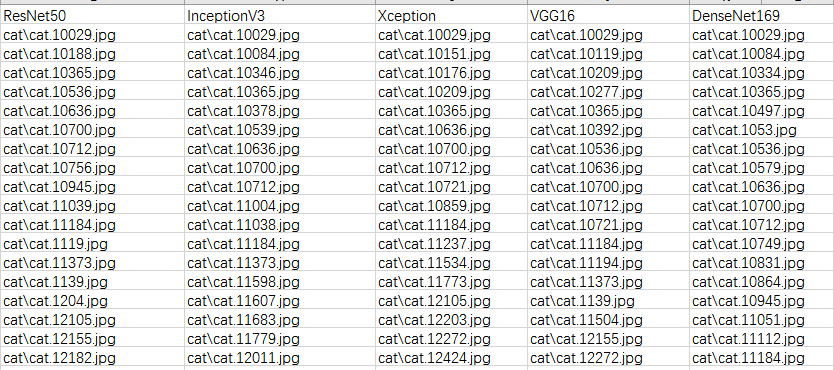
 
` print("ERROR>> %18s    num:%6d     tag:%s    name:%18s   prob:%s" 
              %(train_generator.filenames[i], i, pred[i][0][0],
                pred_name, pred[i][0][2]))`
                
 这个会打印出异常图片的名字、index、top1的tag、类别名、概率
                
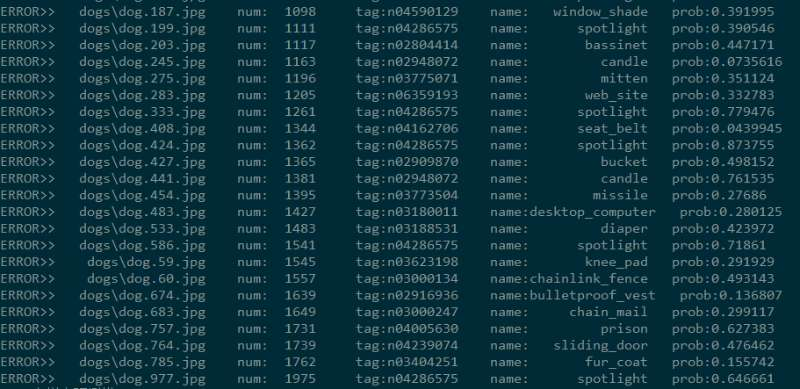

In [ ]:
# parse json file
file = open(json_file,'r',encoding='utf-8')  
imagenet_c = json.load(file)
imagenet_c_l = list(imagenet_c.values())
imagenet_c_n = np.array(imagenet_c_l)

anomaly_file = 'anomaly_file.csv'

if (os.path.exists(anomaly_file)):
    df = pd.read_csv(anomaly_file)
else:
    #df = pd.DataFrame(columns=model_list)
    df = pd.DataFrame()
    df.to_csv(anomaly_file)
    df = pd.read_csv(anomaly_file)
index = range(1,1001)

# 预测异常分析
anomaly_ok = 0
anomaly_num = 0
for i in range(len(pred)):
    for j in range(top):
        if pred[i][j][0] in cat_dog:
            '''
            name = train_generator.filenames[i]
            if (name.find('error') != -1):
                anomaly_ok+=1
                print("error : %s" % train_generator.filenames[i])
            '''
            break;
    else:
        anomaly_num+=1
        
        # 1000分类对于的类别名
        pred_name = imagenet_c_n[np.argwhere(imagenet_c_n==
                   pred[i][0][0])[0][0]][1]
        
        name = train_generator.filenames[i]
        error_list.append(name)
       
        #df = df.append({model_name:name}, ignore_index=True)
        #异常文件名
        filename = name[name.find('\\')+1:]
        #复制异常文件到指定文件夹
        shutil.copy(train_data_dir+name, anomaly_data_dir+filename)
        
        print("ERROR>> %18s    num:%6d     tag:%s    name:%18s   prob:%s" 
              %(train_generator.filenames[i], i, pred[i][0][0],
                pred_name, pred[i][0][2]))
        
print("%d个样本预测错%d  anomaly_ok:%d" %(len(pred), anomaly_num, anomaly_ok))
#df = pd.DataFrame(data=error_list, columns=model_list) 
df[model_name] = pd.Series(error_list)
df.to_csv(anomaly_file)

我们实验记录了5个模型top5、top10、top15、top20、top25、top30对应的异常图片的个数
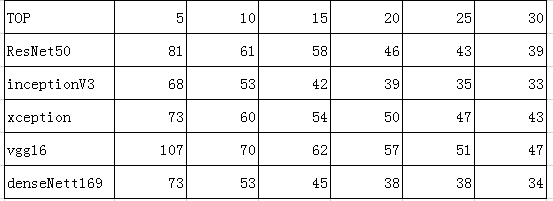

由于我们人为的放入47个图片，所以我选择了50-60的异常值对应的每个模型所设置的top值，ResNet50设置top15、InceptionV3设置top10、Xception设置top15、VGG16设置top20、DenseNet169设置top10


 - 全体Train数据的筛选
 
 使用5个模型筛选预测后并集异常的图片数有437个，每个模型的异常个数在140个左右。生成的异常数据有点多，其实可以再修改top值，来减少异常值的个数，这里我们就直接手动筛选了。
 
通过分析437异常的图片，我们将异常的图片分为了5类：背景太复杂、目标太小、多目标、特征不明显、不是猫和狗


背景太复杂：
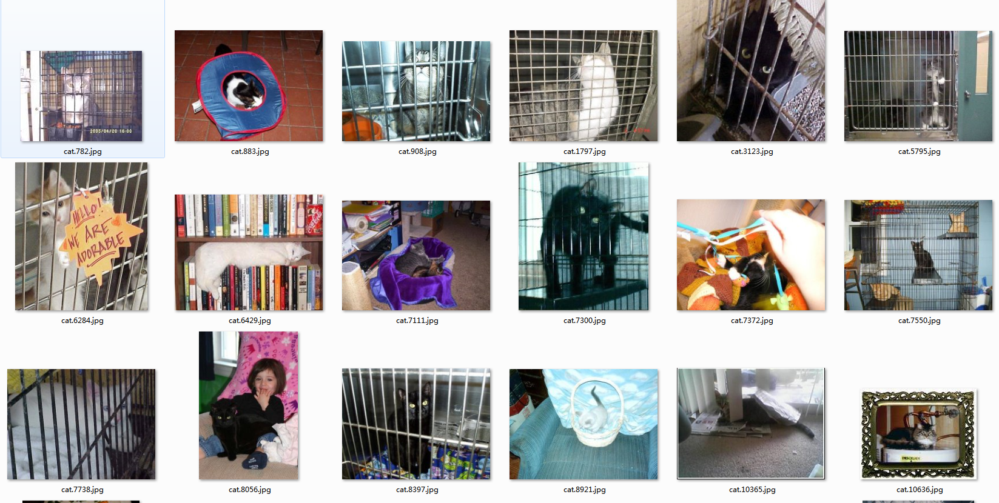


目标太小：
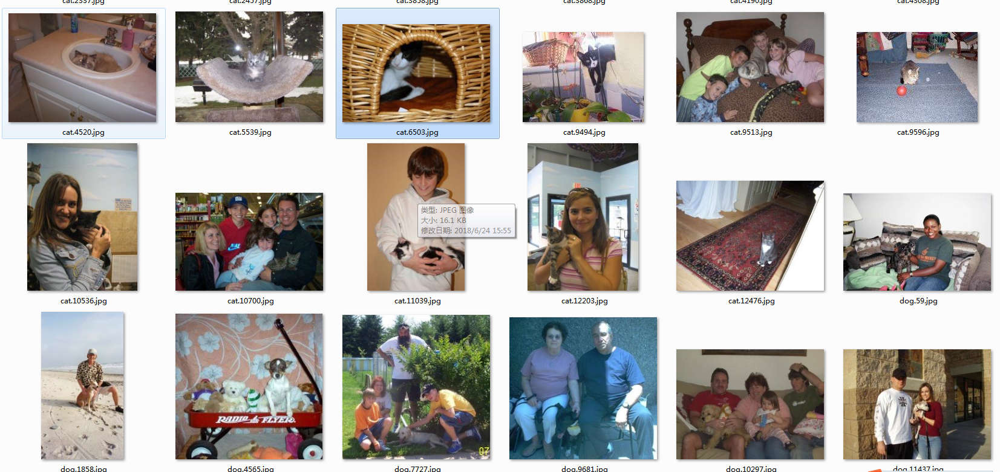

多目标：
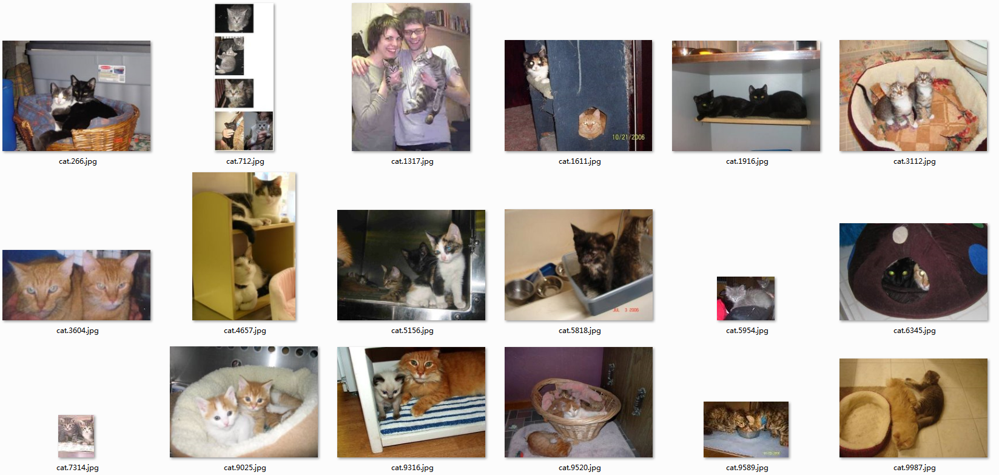

特征不明显：
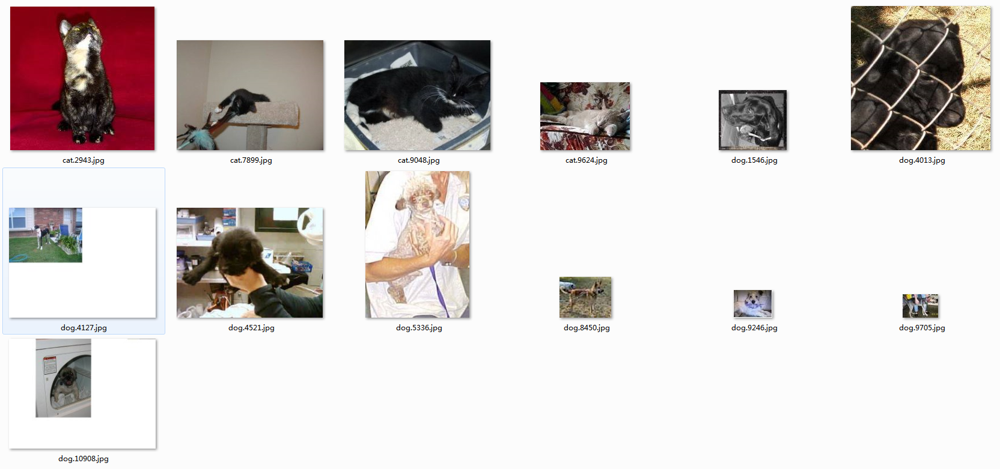

不是猫和狗：
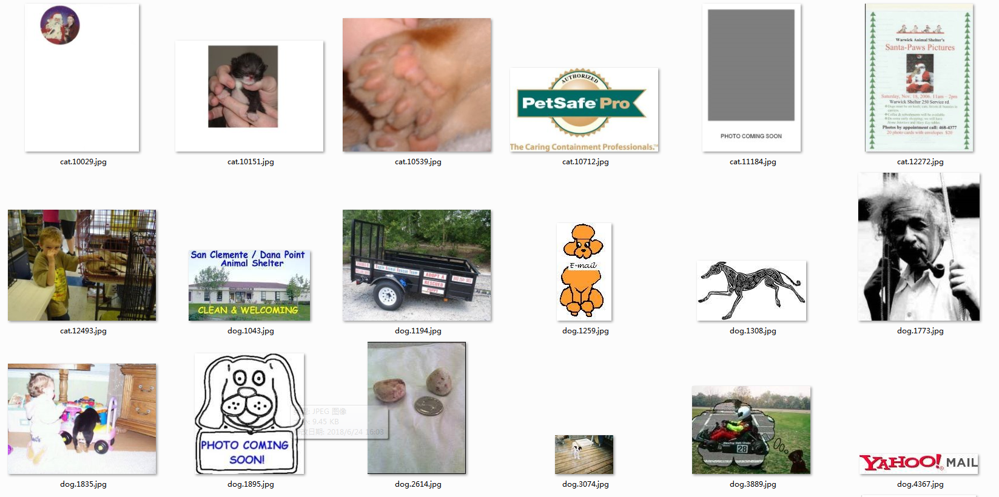


## 四、 建模 
### 1、框架选择 Deep Learning Framework
下图是一些流行的框架，由于我是初学者，选择了Keras框架来实现这个算法。
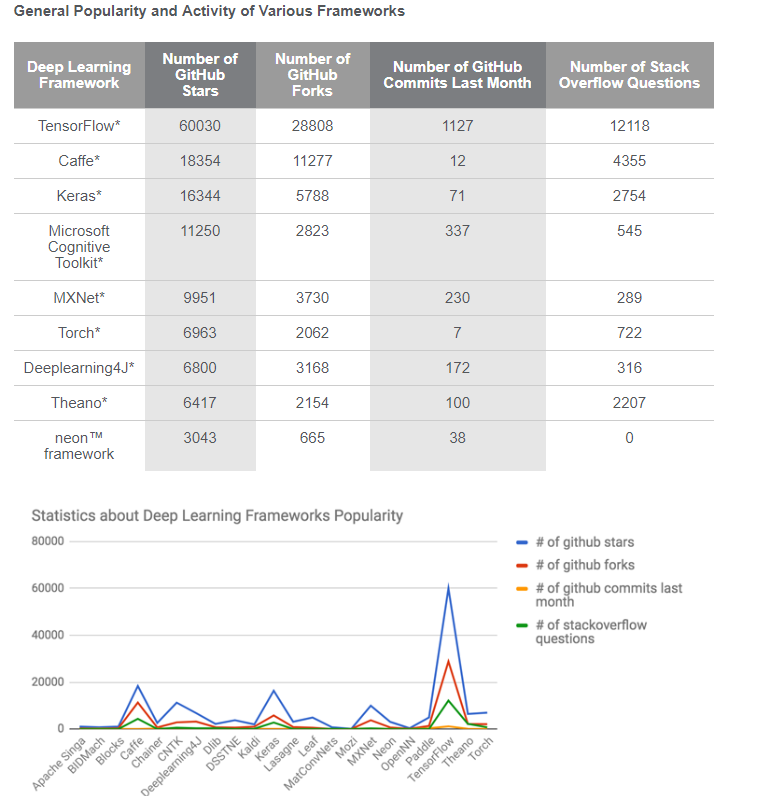

Keras *是一个用Python编写的高级神经网络API，能够在TensorFlow或Theano之上运行。它专注于实现快速实验。能够以最小的延迟从理念到结果是进行良好研究的关键。

主要特征：

    用户友好性 - 最大限度地减少常见用例所需的用户操作数量，并针对用户错误提供清晰且可操作的反馈
    模块化 - 模型被理解为独立的，完全可配置模块的序列或图形，可以通过尽可能少的限制插入在一起
    易扩展性 - 新模块很容易添加为新的类和函数，现有模块提供了充足的示例
    
### 2、模型设计 
   迁移学习是指使用在大致相同性质的不同数据集上训练的模型（通常非常大）的一组技术。
   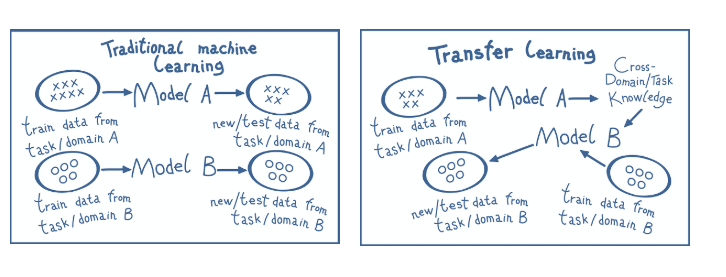
迁移学习用法有三种主要方案：

    预训练模型。一个人只需要由其他人训练的模型，并将其用于感兴趣的任务中。如果任务非常相似，则可以这样做。
    特征提取器。到目前为止，我们知道模型体系结构可以分为两个主要部分：特征提取器，负责从输入数据中提取特征和分类头，它根据精心设计的特征对示例进行分类。特征提取器通常构成模型的主要部分。我们的想法是从在不同任务上训练的模型中获取特征提取器部分，修复其权重（使其不可训练），并为其上的感兴趣的任务构建新的分类部分。分类部分通常不是很深，由几层密集层组成; 因此，这样的模型更容易训练。
    深度微调。此方法类似于特征提取器方案。除了特征提取器部分被冻结之外，我们做了完全相同的事情。例如，可以考虑将VGG *网络作为特征提取器并仅冻结前三个（四个）卷积块。在这种情况下，特征提取器可能更好地适应当前问题。有关详细信息，请参阅F. Chollet的博客文章，使用非常少的数据构建强大的图像分类模型。
关于迁移学习使用情景的详细信息可以在CS231n视觉识别卷积神经网络，李飞飞的 CNNs斯坦福课程和转学习 - 机器学习的下一个前沿， S.Ruder的博客文章中找到（更全面的） ）。

人们可能想知道这样做的原因是什么以及它可能起作用的原因：

    使用大数据集可以获益。例如，我们可以从ImageNet *数据集中的1400万个图像中训练的模型中获取特征提取器部分。这些模型非常复杂，可以从数据中提取非常好的特征。
    时间考虑。训练大型模型可能需要数周甚至数月。在这种情况下，可以节省大量的时间和计算资源。
    这一切可能起作用的强有力假设：通过一项任务学习的特征可能对另一项任务有用且适用。换句话说，特征具有关于任务的不变性。请注意，新任务的域应类似于初始任务的域。否则，特征提取器甚至可能使结果恶化。
    我们首先使用单模型来训练，然后使用模型融合训练。

### 3、实现及调试
    
 a、首先执行cat_dog_rm_anomaly.py将训练集中的异常数据删除。并将数据分为训练集和测试集

In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Tue Jun 26 11:35:12 2018

@author: dawa
"""

import os
import random
import shutil

anomaly_dir = ''
train_dog_dir = 'data\\train_all\\dogs'
train_cat_dir = 'data\\train_all\\cats'
anomaly_dir = 'data\\Anomaly_data\\Obvious'

valid_dog_dir = 'data\\valid\\dogs'
valid_cat_dir = 'data\\valid\\cats'


anomaly_list = os.listdir(anomaly_dir)

for i in range(len(anomaly_list)):
    dog_file = os.path.join(train_dog_dir, anomaly_list[i])
    cat_file = os.path.join(train_cat_dir, anomaly_list[i])
    if (os.path.exists(dog_file)):
        print(dog_file)
        os.remove(dog_file)
        
    if (os.path.exists(cat_file)):
        print(cat_file)
        os.remove(cat_file)
        
#valid_dog = []
#valid_cat = []
#test_dog = []

dog_list = os.listdir(train_dog_dir)
cat_list = os.listdir(train_cat_dir)

valid_dog = random.sample(dog_list, 2500) 
valid_cat = random.sample(cat_list, 2500) 


for name in valid_dog:
    srcname = os.path.join(train_dog_dir, name)
    dstname = os.path.join(valid_dog_dir, name)
    shutil.move(srcname,dstname)

for name in valid_cat:
    srcname = os.path.join(train_cat_dir, name)
    dstname = os.path.join(valid_cat_dir, name)
    shutil.move(srcname,dstname)

#shutil.move(srcfile,dstfile)          #移动文件

b、单模型Xception模型的实现

In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Sun Jun 17 10:10:33 2018

@author: Administrator
"""

'''This script goes along the blog post
"Building powerful image classification models using very little data"
from blog.keras.io.
It uses data that can be downloaded at:
https://www.kaggle.com/c/dogs-vs-cats/data
In our setup, we:
- created a data/ folder
- created train/ and validation/ subfolders inside data/
- created cats/ and dogs/ subfolders inside train/ and validation/
- put the cat pictures index 0-999 in data/train/cats
- put the cat pictures index 1000-1400 in data/validation/cats
- put the dogs pictures index 12500-13499 in data/train/dogs
- put the dog pictures index 13500-13900 in data/validation/dogs
So that we have 1000 training examples for each class, and 400 validation examples for each class.
In summary, this is our directory structure:
```
data/
    train/
        dogs/
            dog001.jpg
            dog002.jpg
            ...
        cats/
            cat001.jpg
            cat002.jpg
            ...
    validation/
        dogs/
            dog001.jpg
            dog002.jpg
            ...
        cats/
            cat001.jpg
            cat002.jpg
            ...
```
'''

from keras import applications
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense
from keras.models import Model
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.layers.advanced_activations import LeakyReLU, PReLU
from keras import regularizers
from keras.layers import GlobalAveragePooling2D
from keras.layers.normalization import BatchNormalization
import os
import numpy as np

# path to the model weights files.
top_model_weights_path = 'bottleneck_fc_model.h5'
# dimensions of our images.

train_data_dir = 'data/train_all/'
validation_data_dir = 'data/valid/'
#train_data_dir = 'data/train/'
#validation_data_dir = 'data/validation/'
model_save_path = 'model/xception_model.h5'

nb_train_samples = (len(os.listdir(train_data_dir+'dogs')) +
                        len(os.listdir(train_data_dir+'cats')))
nb_validation_samples = (len(os.listdir(validation_data_dir+'dogs')) +
                        len(os.listdir(validation_data_dir+'cats')))
epochs = 50
batch_size = 16


# save the anomaly filename list
model_list = ['ResNet50', 'InceptionV3', 'Xception', 'VGG16', 'DenseNet169']

def model_init(model_type):
    if model_type == 'Xception':
        img_width, img_height = 299, 299
        from keras.applications.xception import preprocess_input
        model = applications.xception.Xception(weights='imagenet',
                                               include_top=False,
                                               input_shape=(img_width,img_height,3),
                                               pooling = 'avg',
                                               classes = 2)
        
    elif model_type == 'VGG16':
        img_width, img_height = 224, 224
        from keras.applications.vgg16 import preprocess_input, decode_predictions
        model = applications.VGG16(weights='imagenet', 
                            include_top=False, input_shape=(img_width,img_height,3))
        
    elif model_type == 'ResNet50':
        img_width, img_height = 224, 224
        from keras.applications.resnet50 import preprocess_input, decode_predictions
        model = applications.ResNet50(weights='imagenet', 
                            include_top=False, input_shape=(img_width,img_height,3))
        
    elif model_type == 'InceptionV3':
        img_width, img_height = 299, 299
        from keras.applications.inception_v3 import preprocess_input, decode_predictions
        model = applications.InceptionV3(weights='imagenet', 
                            include_top=False, input_shape=(img_width,img_height,3))
        
    elif model_type == 'DenseNet169':
        img_width, img_height = 224, 224
        from keras.applications.densenet import preprocess_input, decode_predictions
        model = applications.DenseNet169(weights='imagenet', 
                                include_top=False, input_shape=(img_width,img_height,3))
        
        
    return model, preprocess_input, img_width, img_height

#7000 valid        
#0.5  256  xception_model_0.025.h5
#0.3  256  xception_model0.02338.h5

#5000 valid
#0.3  256  LeakyReLU  adam  
#0.3  256  PReLU  adam    0.01367
    
dropout = 0.3

model, preprocess_input, img_width, img_height = model_init(model_list[2])

top_model = Sequential()
#top_model.add(Flatten(input_shape=model.output_shape[1:]))
#top_model.add(GlobalAveragePooling2D())
top_model.add(Dropout(dropout))
#top_model.add(Dense(256, activation='relu',kernel_regularizer=regularizers.l2(0.01)))
#top_model.add(BatchNormalization())
#top_model.add(Dense(256, activation='relu'))
top_model.add(Dense(256, activation='linear'))
#top_model.add(LeakyReLUalpha=.001))
top_model.add(PReLU())
top_model.add(Dropout(dropout))
top_model.add(Dense(1, activation='sigmoid'))

model = Model(inputs=model.input, outputs=top_model(model.output))

#for i, layer in enumerate(model.layers):
#   print(i, layer.name)

for layer in model.layers[:130]:
    layer.trainable = False


# compile the model with a SGD/momentum optimizer
# and a very slow learning rate.

#adam = optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999,
#                      epsilon=None, decay=0.0, amsgrad=False)

model.compile(loss='binary_crossentropy',
              #optimizer='adadelta',
              optimizer='adam',
              metrics=['accuracy'])

#model.summary()

# prepare data augmentation configuration
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
#train_datagen = ImageDataGenerator(rescale=1. / 255)

#valid_datagen = ImageDataGenerator(rescale=1. / 255)
valid_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary')

validation_generator = valid_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='binary')

nb_train_steps = np.ceil(nb_train_samples/batch_size)
nb_validation_steps = np.ceil(nb_validation_samples/batch_size)

early_stop = EarlyStopping(monitor='val_loss', verbose=1, patience=5, mode='min')
checkpoint = ModelCheckpoint(model_save_path, monitor='val_loss', verbose=1,
                save_best_only=True, save_weights_only=False, mode='auto', period=1)

# fine-tune the model
model.fit_generator(
    train_generator,
    steps_per_epoch=nb_train_steps,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=nb_validation_steps,
    callbacks = [checkpoint, early_stop],
    verbose=1)


c、模型融合的实现
我们使用了InceptionV3、Xception、mobileNasnet，三个模型来预测。可以把mobileNasnet换成VGG16

In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Fri Jul  6 22:59:11 2018

@author: Administrator
"""

from keras import applications
from keras.preprocessing.image import ImageDataGenerator
#from keras.applications.nasnet import preprocess_input
from keras.layers import Dropout, Flatten, Dense
from keras.models import Sequential
from keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.utils import shuffle
from keras.models import Model
from keras.layers import Input
from keras.models import load_model
import numpy as np
import os
import h5py
import pandas as pd

train_data_dir = 'data/train_all/'
validation_data_dir = 'data/valid/'
test_dir = 'data/test/'

nasnet = "model/gap_nasnet.h5"
#bottleneck_train = 'model/bottleneck_features_train.npy'
#bottleneck_valid = 'model/bottleneck_features_validation.npy'
model_save_path = 'model/all_model.h5'

batch_size = 16
epochs = 50

filename = ["gap_Xception.h5", "gap_InceptionV3.h5"]
model_list = ['ResNet50', 'InceptionV3', 'Xception', 'VGG16', 'DenseNet169', 'Nasnet']

#nb_train_samples = len(os.listdir(train_data_dir+'train'))

nb_train_cats = len(os.listdir(train_data_dir+'dogs'))
nb_train_dogs = len(os.listdir(train_data_dir+'cats'))
nb_train_samples = nb_train_cats + nb_train_dogs

nb_valid_cats = len(os.listdir(validation_data_dir+'dogs'))
nb_valid_dogs = len(os.listdir(validation_data_dir+'cats'))
nb_validation_samples = nb_valid_cats + nb_valid_dogs

nb_test = len(os.listdir(test_dir + 'test'))



def model_init(model_type):
    if model_type == 'Xception':
        img_width, img_height = 299, 299
        from keras.applications.xception import preprocess_input
        model = applications.xception.Xception(weights='imagenet',
                                               include_top=False,
                                               input_shape=(img_width,img_height,3),
                                               pooling = 'avg',
                                               classes = 2)
        
    elif model_type == 'VGG16':
        img_width, img_height = 224, 224
        from keras.applications.vgg16 import preprocess_input
        model = applications.VGG16(weights='imagenet', 
                                    include_top=False,
                                    input_shape=(img_width,img_height,3),
                                    pooling = 'avg')
        
    elif model_type == 'ResNet50':
        img_width, img_height = 224, 224
        from keras.applications.resnet50 import preprocess_input, decode_predictions
        model = applications.ResNet50(weights='imagenet', 
                                      include_top=False,
                                      pooling = 'avg',
                                      input_shape=(img_width,img_height,3))
        
    elif model_type == 'InceptionV3':
        img_width, img_height = 299, 299
        from keras.applications.inception_v3 import preprocess_input, decode_predictions
        model = applications.InceptionV3(weights='imagenet', 
                                         include_top=False,
                                         pooling = 'avg',
                                         input_shape=(img_width,img_height,3))
                    
    elif model_type == 'DenseNet169':
        img_width, img_height = 224, 224
        from keras.applications.densenet import preprocess_input, decode_predictions
        model = applications.DenseNet169(weights='imagenet', 
                                         pooling = 'avg',
                                         include_top=False,
                                         input_shape=(img_width,img_height,3))
        
    elif model_type == 'Nasnet':
        img_width, img_height = 224, 224
        from keras.applications.nasnet import preprocess_input, decode_predictions
        model = applications.nasnet.NASNetMobile (weights='imagenet', 
                                                  include_top=False, 
                                                  input_shape=(img_width,img_height,3),
                                                  pooling = 'avg',
                                                  )

    return model, preprocess_input, img_width, img_height



def save_bottlebeck_features(model, preprocess_input, img_width, img_height, num):
    datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

    train_generator = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        shuffle=False)
    
    bottleneck_features_train = model.predict_generator(train_generator)
    
    valid_generator = datagen.flow_from_directory(
        validation_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        shuffle=False)
    
    bottleneck_features_valid = model.predict_generator(
        valid_generator, np.ceil(nb_validation_samples/batch_size))
    
    
    test_generator = datagen.flow_from_directory(
        test_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        shuffle=False)
    
    bottleneck_features_test = model.predict_generator(
        test_generator, np.ceil(nb_test/batch_size))
    
    with h5py.File("model/gap_%s.h5"%model_list[num]) as h:
        h.create_dataset("train", data=bottleneck_features_train)
        h.create_dataset("t_label", data=train_generator.classes)
        h.create_dataset("valid", data=bottleneck_features_valid)
        h.create_dataset("v_label", data=valid_generator.classes)
        h.create_dataset("test", data=bottleneck_features_test)


def train_top_model():
    X_train = []
    X_valid = []
    X_test = []
    
    with h5py.File(nasnet, 'r') as h:
        #X_train.append(np.array(h['train']))
        X_train = np.array(h['train'])
        X_valid = np.array(h['valid'])
        X_test = np.array(h['test'])
        y_train = np.array(h['t_label'])
        y_valid = np.array(h['v_label'])
        
    #X_train = np.concatenate(X_train, axis=1)
    #X_test = np.concatenate(X_test, axis=1)
    
    X_train, y_train = shuffle(X_train, y_train)
    
    input_tensor = Input(X_train.shape[1:])
    x = Dropout(0.5)(input_tensor)
    x = Dense(1, activation='sigmoid')(x)
    model = Model(input_tensor, x)
    
    model.compile(optimizer='adam',
      loss='binary_crossentropy',
      metrics=['accuracy'])
    early_stop = EarlyStopping(monitor='val_loss', verbose=1, patience=5, mode='min')
    checkpoint = ModelCheckpoint(model_save_path, monitor='val_loss', verbose=1,
                save_best_only=True, save_weights_only=False, mode='auto', period=1)
    
    model.fit(X_train, y_train,
              epochs=epochs,
              batch_size=batch_size,
              callbacks = [early_stop, checkpoint],
              validation_data=(X_valid, y_valid)
              )
    #model.save_weights(model_save_path) 


#def train_topall_model():
X_train = []
X_test = []
X_valid = []

for filename in ["model/gap_Nasnet.h5", "model/gap_Xception.h5", "model/gap_InceptionV3.h5"]:
    with h5py.File(filename, 'r') as h:
        X_train.append(np.array(h['train']))
        X_valid.append(np.array(h['valid']))
        X_test.append(np.array(h['test']))
        y_train = np.array(h['t_label'])
        y_valid = np.array(h['v_label'])

X_train = np.concatenate(X_train, axis=1)
X_valid = np.concatenate(X_valid, axis=1)
X_test = np.concatenate(X_test, axis=1)

X_train, y_train = shuffle(X_train, y_train)
X_valid, y_valid = shuffle(X_valid, y_valid)

input_tensor = Input(X_train.shape[1:])
x = Dropout(0.25)(input_tensor)
x = Dense(1, activation='sigmoid')(x)
model = Model(input_tensor, x)

model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

early_stop = EarlyStopping(monitor='val_loss', verbose=1, patience=5, mode='min')
checkpoint = ModelCheckpoint(model_save_path, monitor='val_loss', verbose=1,
            save_best_only=True, save_weights_only=False, mode='auto', period=1)

model.fit(X_train, y_train,
          epochs=epochs,
          batch_size=batch_size,
          callbacks = [early_stop, checkpoint],
          validation_data=(X_valid, y_valid)
          )


model = load_model('model/all_model.h5')
y_pred = model.predict(X_test, verbose=1)
y_pred = y_pred.clip(min=0.005, max=0.995)

df = pd.DataFrame()

gen = ImageDataGenerator()
test_generator = gen.flow_from_directory(test_dir, (224, 224), shuffle=False, 
                                         batch_size=16, class_mode=None)
file_list = test_generator.filenames

for i in range(len(file_list)):
    index = file_list.index('test\\'+ str(i+1) +'.jpg')
    df.set_value(i+1, 'label', y_pred[index])

df.index.name = 'id'
df.to_csv('submit/pred_merge.csv')
df.head(10)

n = 5
#model, preprocess_input, img_width, img_height = model_init(model_list[n])    
#save_bottlebeck_features(model, preprocess_input, img_width, img_height, n)
#train_top_model()
#train_topall_model()



d、预测并提交Kaggle查看排名
    执行cat_dog_predict.py会生成提交文件pred_merge.csv

在kaggle注册账号并登陆后，打开下面链接
https://www.kaggle.com/c/dogs-vs-cats-redux-kernels-edition/submissions?sortBy=date&group=all&page=1
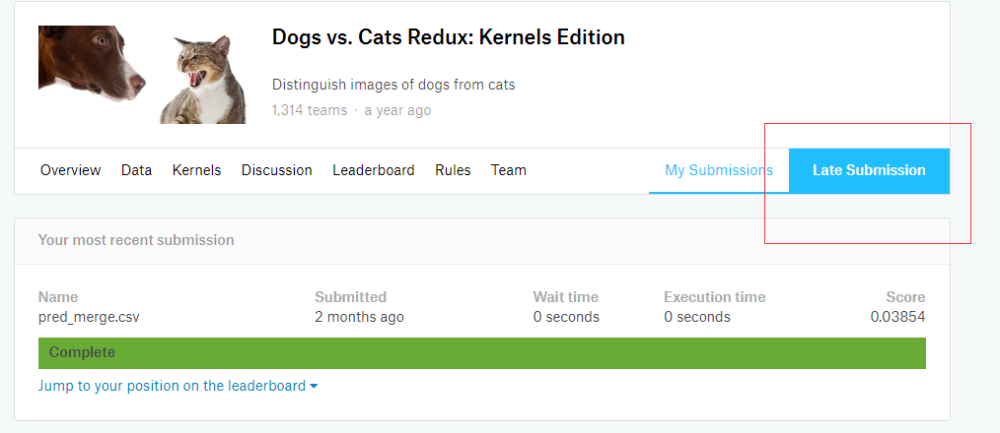
点击红框中的按钮，然后点击下图中的Upload submission file上传pred_merge.csv文件就会生成分数。然后在My Submissions中即可查看到你的分数
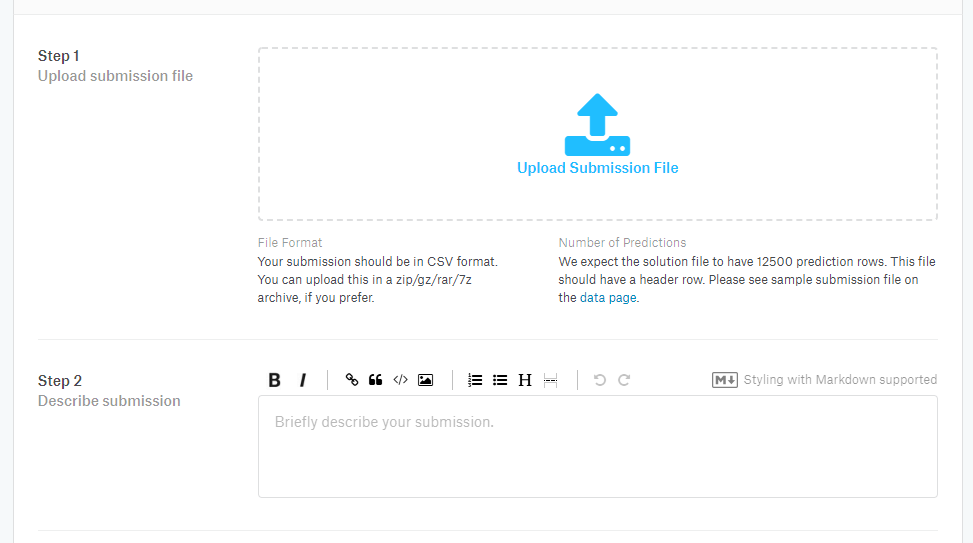

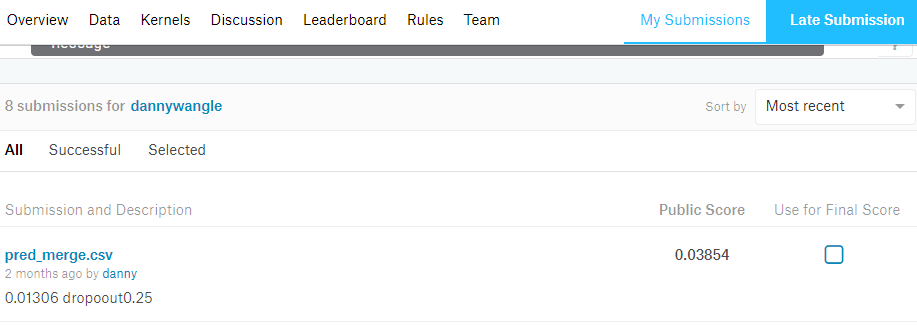
可以看到0.03854的分数可以排在12名
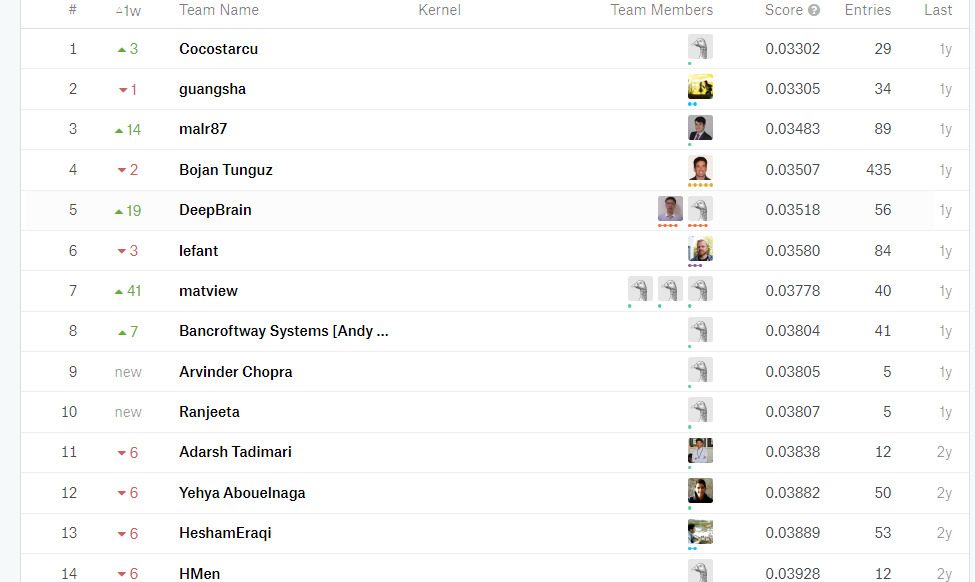

In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Tue Jul  3 23:18:46 2018

@author: Administrator
"""


from keras.models import load_model
from keras.applications.xception import preprocess_input
from keras.preprocessing.image import ImageDataGenerator
import pandas as pd

model_path = 'model/xception_model_0.01367.h5'
test_data_dir = 'data/test/'
model = load_model(model_path)


submiss_file = 'submit/sample_submission_0.01367.csv'

df = pd.DataFrame()


img_width, img_height = 299, 299
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

test_generator = test_datagen.flow_from_directory(test_data_dir, 
                                    target_size=(img_width, img_height),
                                    shuffle=False,
                                    class_mode="binary",
                                    batch_size=16)


test_pred = model.predict_generator(test_generator, verbose=1)
test_pred = test_pred.clip(min=0.005, max=0.995)

file_list = test_generator.filenames

for i in range(len(file_list)):
    index = file_list.index('test\\'+ str(i+1) +'.jpg')
    df.set_value(i+1, 'label', test_pred[index])

'''
for i, fname in enumerate(test_generator.filenames):
    index = int(fname[fname.rfind('\\')+1:fname.rfind('.')])
    df.set_value(index-1, 'label', test_pred[i])
'''

df.index.name = 'id'
df.to_csv(submiss_file)
df.head(10)

### 4、实验和调参
调试过程中，有过拟合的现象，修改了Dropout参数，修改优化器、和top_model的复杂度。使用了EarlyStopp
### 5、模型提升
模型融合中将NASNetMobile换成NASNet

## 五、结论
